# notebook to take a look at the movie temporal components

In [11]:
from scipy.io import loadmat
from matplotlib import pyplot as plt
import numpy as np
import seaborn as sns
sns.color_palette("colorblind")
import pandas as pd
import nascar_utility
from sklearn.metrics import explained_variance_score
import sys
sys.path.insert(0, '/om2/scratch/Wed/jsmentch/nat_img/code')

from hrf_tools import apply_optimal_hrf_10hz
import npp

# Import the function from the file
import utility

## First take a look at MovieTP

In [12]:
#task='rest_run-1'
task='movieTP'

In [13]:
O,Y,components,temporal_modes,contributions,lambda2=nascar_utility.load_nascar(task)
component_list=nascar_utility.load_components_list(task)

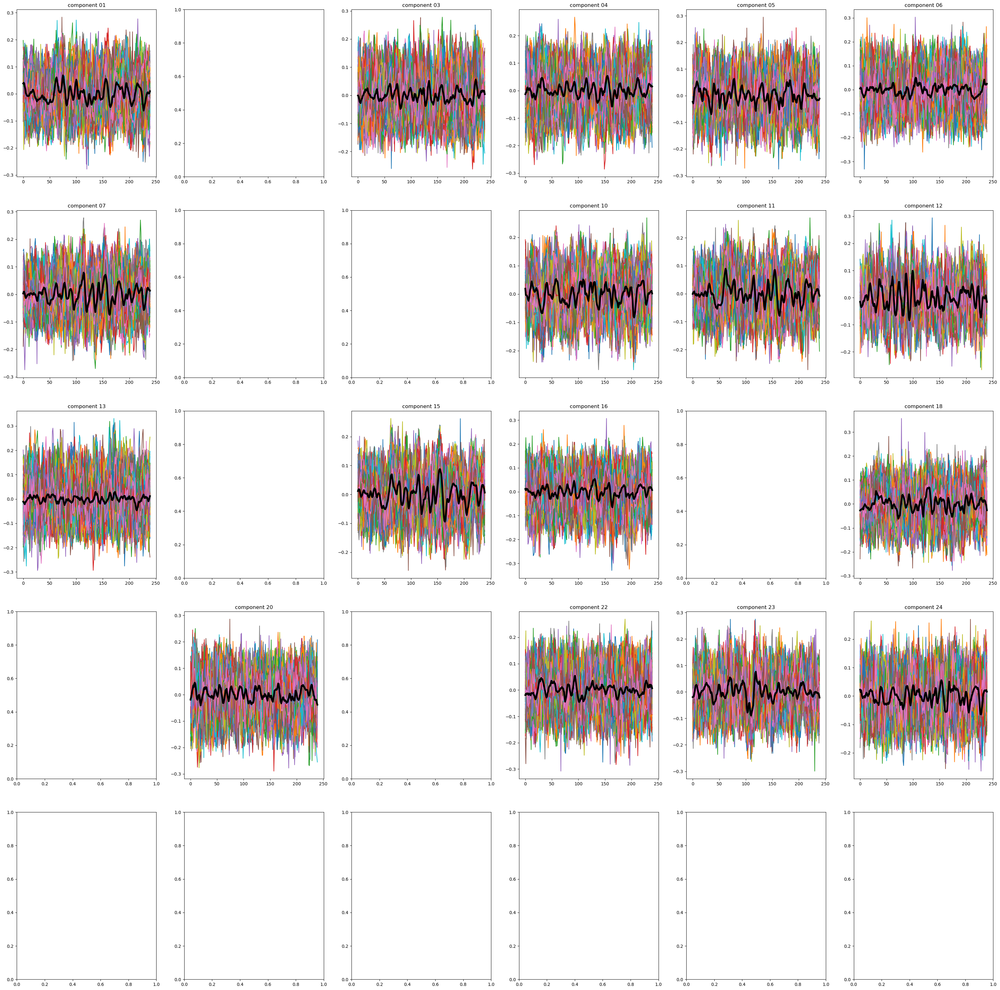

In [14]:
temporal_node_l,temporal_node_n =temporal_modes.shape

fig, axs = plt.subplots(nrows=5, ncols=6, figsize=(40, 40))
#for movieDM:

ylim=0.03
temporal_modes_means=[]
for n in component_list:
    n_ind=n-1
    ss=[]
    axs[n_ind // 6, n_ind % 6].set_title(f"component {n:02d}")
    #axs[n // 6, n % 6].set_ylim([0, ylim])
    for nn in np.arange(contributions.shape[0]):
        s = np.dot(temporal_modes[:,n_ind], O[:,:,nn])
        ss.append(s)
        axs[n_ind // 6, n_ind % 6].plot(s)
    ss=np.asanyarray(ss).T
    abs_temp=np.absolute(ss)
    #axs[n // 6, n % 6].plot(np.mean(abs_temp,axis=1),c='k',linewidth=5,label='mean(abs(components))')
    axs[n_ind // 6, n_ind % 6].plot(np.mean(np.asanyarray(ss),axis=1),c='k',linewidth=4,label='mean(abs(components))')
    temporal_modes_means.append(np.mean(np.asanyarray(ss),axis=1))
temporal_modes_means=np.asanyarray(temporal_modes_means).T



In [15]:
def load_yamnet_info():
    class_names = np.load('/om2/scratch/Wed/jsmentch/nat_img/sourcedata/data/yamnet_class_names.npy')
    as_classes_label = np.zeros((521),dtype='S30')
    as_classes = np.zeros((521))
    as_classes.shape#as_classes = [None] * 521

    as_classes[0:66]=0
    as_classes[66:132]=1
    as_classes[132:277]=2
    as_classes[277:294]=3
    as_classes[294:453]=4
    as_classes[453:500]=5
    as_classes[500:]=6

    as_classes_label[0:66]='Human Sounds'
    as_classes_label[66:132]='Animal'
    as_classes_label[132:277]='Music'
    as_classes_label[277:294]='Natural Sounds'
    as_classes_label[294:453]='Sounds of Things'
    as_classes_label[453:500]='Source Ambiguous Sounds'
    as_classes_label[500:]='Channel, Environment, Background'

    labels=['Human Sounds','Animal','Music','Natural Sounds','Sounds of Things','Source Ambiguous Sounds','Channel, Environment, Background']
    return class_names, as_classes_label, as_classes, labels

### load movie features
load features into 'features' list and their names into 'class_names' list

Music
Speech
feature_names  ['Music', 'Speech', 'optic_flow', 'brightness', 'frac_high_saliency', 'vibrance']
len(features)  6


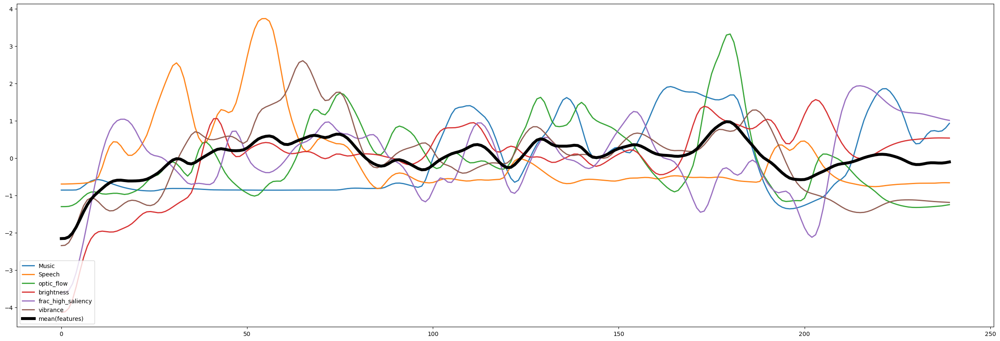

In [16]:
features=[]
feature_names=[]
feature_dir='/om2/scratch/Wed/jsmentch/nat_img/sourcedata/data/HBN/features/'

#load YAMNET audioset features
class_names, as_classes_label, as_classes, labels = load_yamnet_info()
class_names=list(class_names)
as_scores=np.load(f'{feature_dir}TP_as_scores.npy')
as_scores=as_scores[17:,:] #remove first 8 seconds
as_scores=apply_optimal_hrf_10hz(as_scores,2)

#get top 5 audioset features and print them
means=np.mean(as_scores, axis=0)
for l in list (means.argsort()[-2:][::-1] ):
    print(class_names[l])
    features.append( npp.zs(utility.downsample(as_scores[:,l],240)) )
    feature_names.append(class_names[l])

#load more features
#for f in ['optic_flow','brightness','frac_high_saliency','max_saliency','vibrance']:
for f in ['optic_flow','brightness','frac_high_saliency','vibrance']:
    loaded_f=np.load(f'{feature_dir}TP_{f}_10hz.npy')
    loaded_f=loaded_f[80:] #remove first 10 seconds
#     plt.figure(figsize=(20,7))
#     plt.plot(loaded_f)
#     print(np.asanyarray(loaded_f)[np.newaxis,:].shape)
    loaded_f=apply_optimal_hrf_10hz( np.asanyarray(loaded_f)[:,np.newaxis] ,10)
#     plt.figure(figsize=(20,7))
#     plt.plot(loaded_f)
    loaded_f=utility.downsample(list(loaded_f.squeeze()),240)
#     plt.figure(figsize=(20,7))
#     plt.plot(loaded_f)
#     plt.figure(figsize=(20,7))
#     plt.plot(npp.zs(loaded_f) )
    features.append( npp.zs(loaded_f) )
    feature_names.append(f)
    
print('feature_names ', feature_names)
print('len(features) ', len(features) )

plt.figure(figsize=(30,10))
for i,f in enumerate(features):
    plt.plot(f, label=f'{feature_names[i]}',linewidth=2,alpha=0.95)
# for t in np.arange(20):
#     #plt.figure(figsize=(20,7))
#     plt.plot(temporal_modes[:,t],label=f'Component {t+1}',linewidth=2,alpha=0.75)
#plt.ylim( -0.5, 0.5 )
plt.plot(np.mean(np.asanyarray(features),axis=0),c='k',linewidth=5,label='mean(features)')
plt.legend(loc='lower left')

In [17]:

corr_list_list=[]

for t,n in enumerate(component_list):
    corr_list=[]
    current_t=npp.zs(temporal_modes_means[:,t])
    for f in features:
        corr_list.append( np.correlate(f, current_t )[0] )
    corr_list_list.append(corr_list)
corr_list_list=np.asanyarray(corr_list_list)
corr_list_list_abs=np.abs(corr_list_list)


In [18]:
temporal_modes_means.shape

(240, 17)

Text(0.5, 0, 'TR')

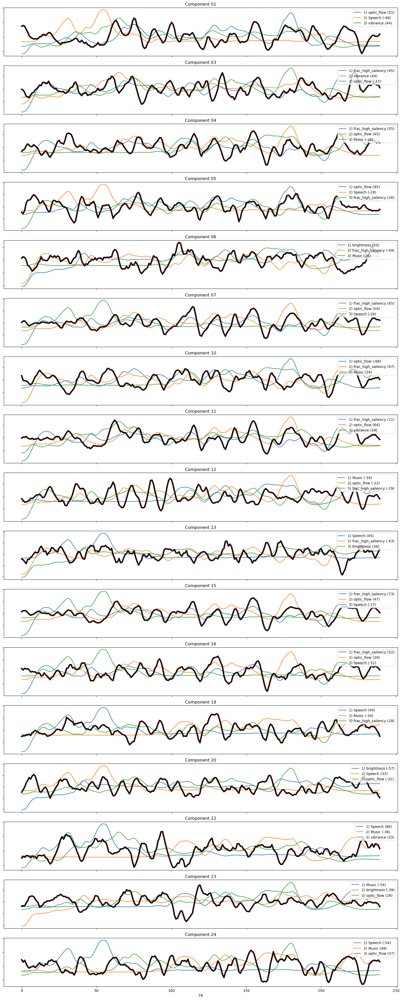

In [19]:
fig, axs = plt.subplots( len(corr_list_list), 1, figsize=(20,50),sharex=True,squeeze=True)
#fig.suptitle('HBN TITLE')
for t,n in enumerate(component_list):
#     axs[0].figure(figsize=(20,7))
    #axs[t].plot( npp.zs(temporal_modes_means[:,t]) ,label=f'Component {n}', color='k', linewidth=3)

    for i,top in enumerate( corr_list_list_abs[t].argsort()[-3:][::-1] ):
        axs[t].plot( features[top], label=f'{i+1}) {feature_names[top]} ({round(corr_list_list[t][top])})', linewidth=1.5)
    axs[t].legend(loc='upper right')
    axs[t].title.set_text(f'Component {n:02d}')
    axs[t].set_yticklabels([])
    axs[t].plot( npp.zs(temporal_modes_means[:,t]) ,label=f'Component {n:02d}', color='k', linewidth=4)
    axs[t].plot( npp.zs(temporal_modes_means[:,t]) ,label=f'Component {n:02d}', color='r', linewidth=0.5)
axs[t].set_xlabel('TR')

Things don't really make too much sense, we want component 12 to show strong audio (or opposite of strong audio)

## Now take a look at MovieDM

In [20]:
#task='rest_run-1'
task='movieDM'

In [21]:
outputs_file=f'../data/nascar_output/all_ses-HBNsiteRU_task-{task}_results.mat'
gbs_file=f'../data/nascar_output/all_ses-HBNsiteRU_task-{task}_GBS.mat'

mat_contents = loadmat(outputs_file)
U2=mat_contents['U2']
lambda2=mat_contents['lambda2']
mat_contents = loadmat(gbs_file)
Y=mat_contents['Y']
O=mat_contents['O']
components=U2[0][0]
temporal_modes=U2[1][0]
contributions=U2[2][0]
mat_contents = loadmat(outputs_file)
U2=mat_contents['U2']
components=U2[0][0]


component_list_file=f'../data/nascar_output/all_ses-HBNsiteRU_task-{task}_good_components.txt'
with open(f'{component_list_file}', 'r') as f:
    # read the contents of the file into a list
    component_list = [int(line.strip()) for line in f.readlines()]

        
print(task)
print('O',O.shape, '       #orthogonal transformation matrix TxTxS')
print('Y',Y.shape, '       #group atlas TxV')
print('components', components.shape)
print('temporal_modes',temporal_modes.shape)
print('contributions',contributions.shape)
print('lambda2',lambda2.shape)
print('component_list',component_list)
#result = np.dot(temporal_modes[:,0], O[:,:,0].T)

movieDM
O (740, 740, 207)        #orthogonal transformation matrix TxTxS
Y (740, 91282)        #group atlas TxV
components (91282, 30)
temporal_modes (740, 30)
contributions (207, 30)
lambda2 (30, 1)
component_list [1, 2, 4, 5, 6, 7, 8, 9, 12, 13, 14, 15, 17, 18, 20, 21, 22, 23, 25]


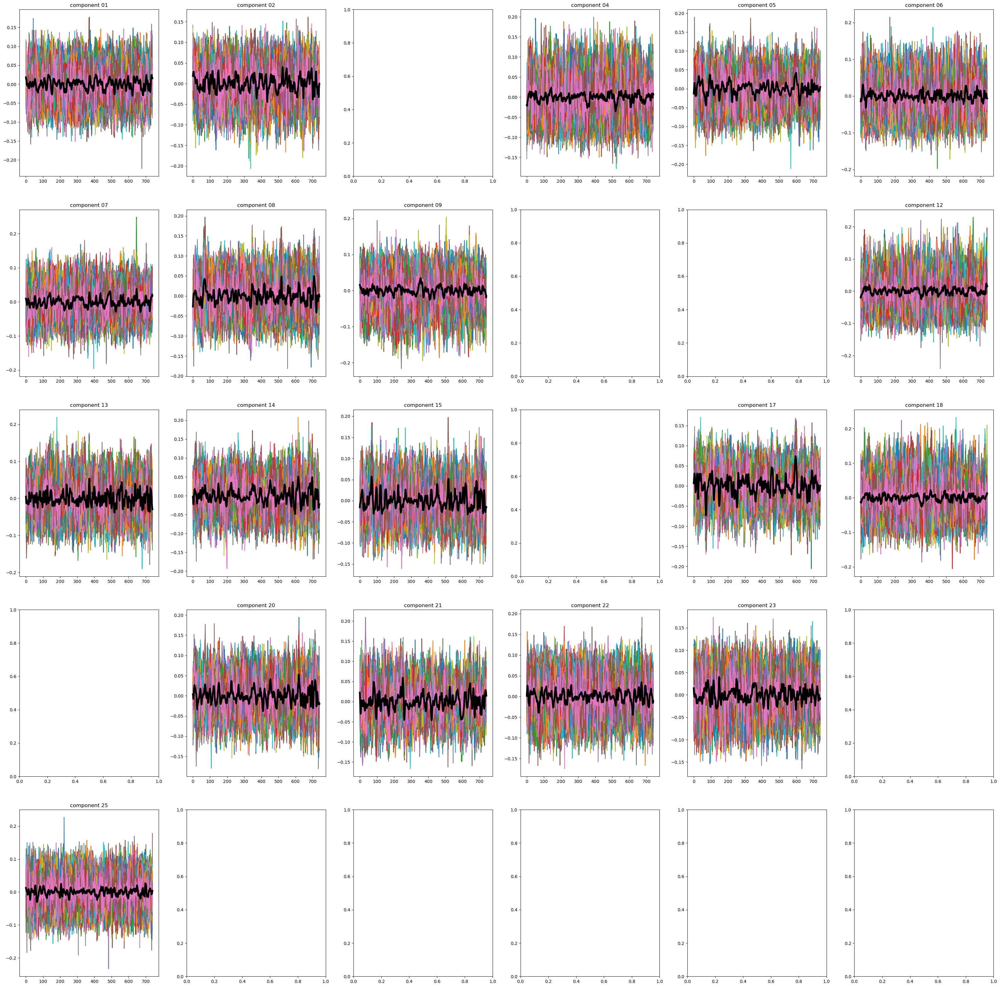

In [22]:
temporal_node_l,temporal_node_n =temporal_modes.shape

fig, axs = plt.subplots(nrows=5, ncols=6, figsize=(40, 40))
#for movieDM:

ylim=0.03
temporal_modes_means=[]
for n in component_list:
    n_ind=n-1
    ss=[]
    axs[n_ind // 6, n_ind % 6].set_title(f"component {n:02d}")
    #axs[n // 6, n % 6].set_ylim([0, ylim])
    for nn in np.arange(contributions.shape[0]):
        s = np.dot(temporal_modes[:,n_ind], O[:,:,nn])
        ss.append(s)
        axs[n_ind // 6, n_ind % 6].plot(s)
    ss=np.asanyarray(ss).T
    abs_temp=np.absolute(ss)
    #axs[n // 6, n % 6].plot(np.mean(abs_temp,axis=1),c='k',linewidth=5,label='mean(abs(components))')
    axs[n_ind // 6, n_ind % 6].plot(np.mean(np.asanyarray(ss),axis=1),c='k',linewidth=4,label='mean(abs(components))')
    temporal_modes_means.append(np.mean(np.asanyarray(ss),axis=1))
temporal_modes_means=np.asanyarray(temporal_modes_means).T



In [23]:
temporal_modes_means.shape

(740, 19)

## plot all of the mean temporal modes

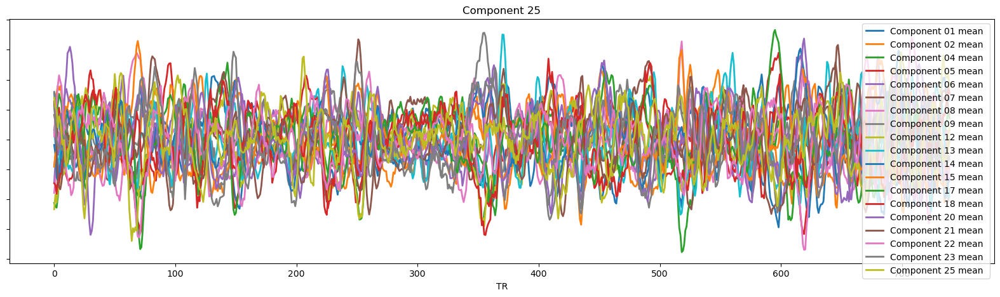

In [24]:
colorblind=list(sns.color_palette("colorblind").as_hex())
colorblind
fig, axs = plt.subplots(1, 1, figsize=(20,5))

for t,n in enumerate(component_list):#[0:2]):
#     axs[0].figure(figsize=(20,7))
    #axs[t].plot( npp.zs(temporal_modes_means[:,t]) ,label=f'Component {n}', color='k', linewidth=3)

    axs.plot( npp.zs(temporal_modes_means[:,t]) ,label=f'Component {n:02d} mean ', linewidth=2)
    axs.title.set_text(f'Component {n:02d}')
    axs.set_yticklabels([])
    axs.legend(loc='upper right')
    #axs.plot( npp.zs(temporal_modes_means[:,t]) ,label=f'Component {n:02d}', color='r', linewidth=0.5)
    axs.set_xlabel('TR')
    #fig.savefig(f'../outputs/figures/HBN_temporal/{task}_temporal_c{n}.png')
    #plt.close(fig)

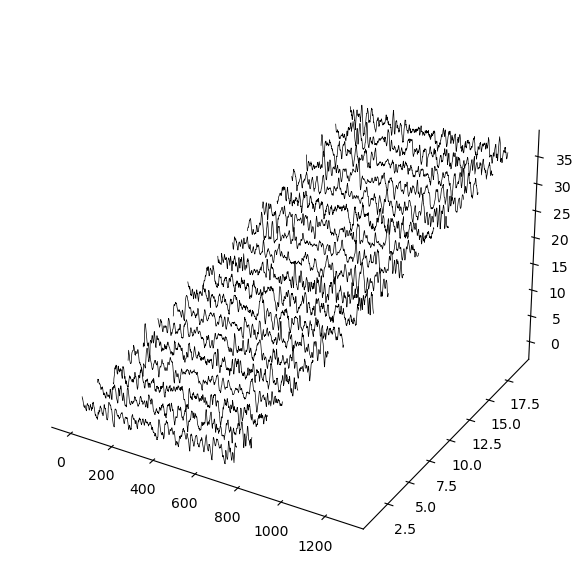

In [25]:
colorblind=list(sns.color_palette("colorblind").as_hex())
fig = plt.figure(figsize=plt.figaspect(0.5)*1.5)
ax = plt.subplot(projection='3d')
# for zi, (xi, yi) in enumerate([(x1, y1), (x2, y2), (x3, y3)]):
#     ax.plot(xi, [zi] * xi.size, yi)
for t,n in enumerate(component_list):#[0:10]):    
    
    axs.title.set_text(f'Component {n:02d}')
    axs.set_yticklabels([])
    axs.legend(loc='upper right')
    #axs.plot( npp.zs(temporal_modes_means[:,t]) ,label=f'Component {n:02d}', color='r', linewidth=0.5)
    axs.set_xlabel('TR')
    #fig.savefig(f'../outputs/figures/HBN_temporal/{task}_temporal_c{n}.png')
    #plt.close(fig)
    
    y=np.arange(temporal_modes_means[:,t].shape[0])
    z=np.ones(temporal_modes_means[:,t].shape[0])

    ax.plot( y+(t*30),z+t, npp.zs(temporal_modes_means[:,t])+(t*2) , label=f'Component {n:02d} mean ', color='k',linewidth=0.5)
ax.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

# Now set color to white (or whatever is "invisible")
ax.xaxis.pane.set_edgecolor('w')
ax.yaxis.pane.set_edgecolor('w')
ax.zaxis.pane.set_edgecolor('w')

# Bonus: To get rid of the grid as well:
ax.grid(False)
plt.show()

### load movie features for DM

In [26]:
from scipy import signal
#it is 1hz from neuroscout
#note the dataset might be bad...
feature_dir='/om2/scratch/Wed/jsmentch/nat_img/sourcedata/data/HBN/features/DM_pliers_all.csv'
df_features=pd.read_csv(feature_dir, index_col=0)
features_loaded=df_features.to_numpy()
feature_names=list(df_features.columns)

#remove first 8 seconds
features_loaded=features_loaded[8:,:]
#apply hrf
features_hrf=apply_optimal_hrf_10hz(features_loaded,1)
#resample to length 740 (10 minutes-8 seconds)
features=[]
for f in np.arange(features_hrf.shape[1]):
    features.append( npp.zs( signal.resample(features_hrf[:,f], 740)  ) )

features_resampled=np.asanyarray(features)



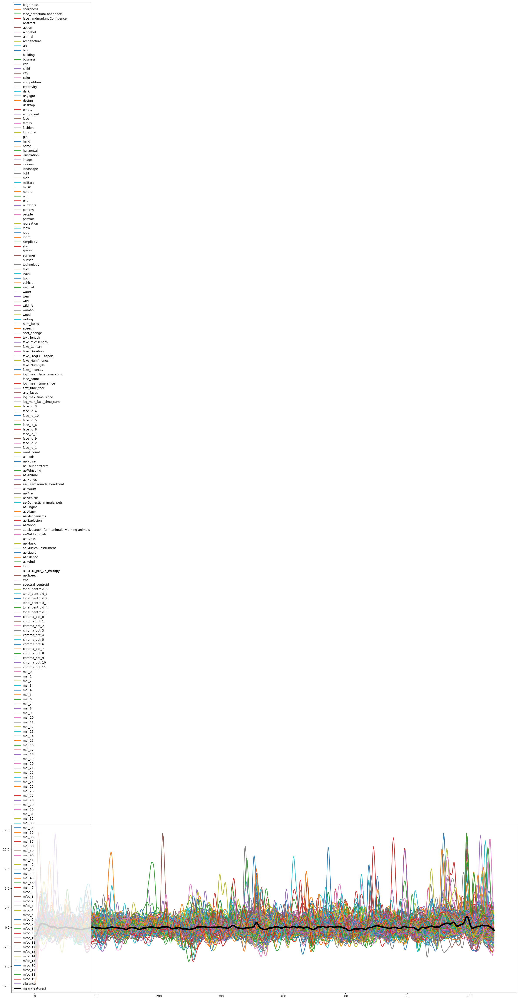

In [27]:
plt.figure(figsize=(30,10))
for i,f in enumerate(features_resampled):
    plt.plot(f, label=f'{feature_names[i]}',linewidth=2,alpha=0.95)
# for t in np.arange(20):
#     #plt.figure(figsize=(20,7))
#     plt.plot(temporal_modes[:,t],label=f'Component {t+1}',linewidth=2,alpha=0.75)
#plt.ylim( -0.5, 0.5 )
plt.plot(np.mean(features_resampled,axis=0),c='k',linewidth=5,label='mean(features)')
plt.legend(loc='lower left')

In [28]:
features_resampled.shape

(215, 740)

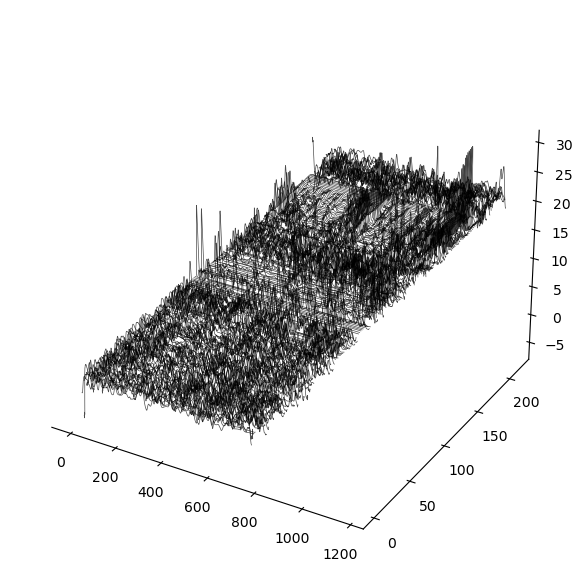

In [29]:
colorblind=list(sns.color_palette("colorblind").as_hex())
fig = plt.figure(figsize=plt.figaspect(0.5)*1.5)
ax = plt.subplot(projection='3d')
# for zi, (xi, yi) in enumerate([(x1, y1), (x2, y2), (x3, y3)]):
#     ax.plot(xi, [zi] * xi.size, yi)
for t in np.arange(features_resampled.shape[0]):#[0:10]):    
    
    axs.title.set_text(f'Component {n:02d}')
    axs.set_yticklabels([])
    axs.legend(loc='upper right')
    #axs.plot( npp.zs(temporal_modes_means[:,t]) ,label=f'Component {n:02d}', color='r', linewidth=0.5)
    axs.set_xlabel('TR')
    #fig.savefig(f'../outputs/figures/HBN_temporal/{task}_temporal_c{n}.png')
    #plt.close(fig)
    
    y=np.arange(features_resampled[t,:].shape[0])
    z=np.ones(features_resampled[t,:].shape[0])

    ax.plot( y+(t*2),z+t, npp.zs(features_resampled[t,:])+(t*.1) , label=f'Component {n:02d} mean ', color='k',alpha=0.7,linewidth=0.5)
ax.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

# Now set color to white (or whatever is "invisible")
ax.xaxis.pane.set_edgecolor('w')
ax.yaxis.pane.set_edgecolor('w')
ax.zaxis.pane.set_edgecolor('w')

# Bonus: To get rid of the grid as well:
ax.grid(False)
plt.show()

In [30]:

corr_list_list=[]
xvar_list_list=[]
for t,n in enumerate(component_list):
    corr_list=[]
    xvar_list=[]
    current_t=npp.zs(temporal_modes_means[:,t])
    for f in features:
        #corr_list.append( np.correlate(f, current_t )[0] ) # cross correlation
        corr_list.append( np.corrcoef(f, current_t )[0,1] ) # pearson correlation
        xvar_list.append( np.corrcoef(f, current_t )[0,1] ) # explained variance
    corr_list_list.append(corr_list)
    xvar_list_list.append(xvar_list)
corr_list_list=np.asanyarray(corr_list_list)
corr_list_list_abs=np.abs(corr_list_list)
xvar_list_list=np.asanyarray(xvar_list_list)
xvar_list_list_abs=np.abs(xvar_list_list)


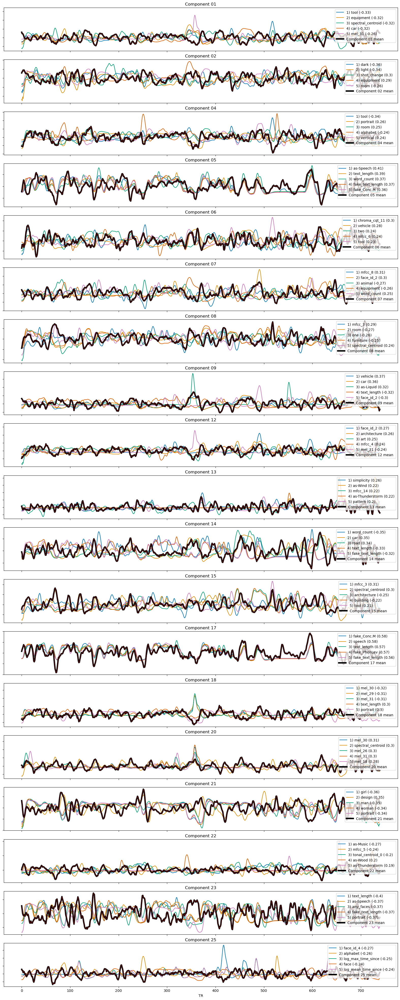

In [31]:
colorblind=list(sns.color_palette("colorblind").as_hex())
colorblind

fig, axs = plt.subplots( len(corr_list_list), 1, figsize=(20,50),sharex=True,squeeze=True)
#fig.suptitle('HBN TITLE')
for t,n in enumerate(component_list):
#     axs[0].figure(figsize=(20,7))
    #axs[t].plot( npp.zs(temporal_modes_means[:,t]) ,label=f'Component {n}', color='k', linewidth=3)

    for i,top in enumerate( corr_list_list_abs[t].argsort()[-5:][::-1] ):
        axs[t].plot( features[top], label=f'{i+1}) {feature_names[top]} ({round(corr_list_list[t][top],2)})', linewidth=1.5, c=colorblind[i])
    axs[t].title.set_text(f'Component {n:02d}')
    axs[t].set_yticklabels([])
    axs[t].plot( npp.zs(temporal_modes_means[:,t]) ,label=f'Component {n:02d} mean ', color='k', linewidth=4)
    axs[t].legend(loc='upper right')
    axs[t].plot( npp.zs(temporal_modes_means[:,t]) ,label=f'Component {n:02d}', color='r', linewidth=0.5)
axs[t].set_xlabel('TR')

plt.savefig(f'../outputs/figures/results/{task}_temporal_overview.png')
#plt.close(fig)

## plot them individually and save

In [33]:
colorblind=list(sns.color_palette("colorblind").as_hex())
colorblind

for t,n in enumerate(component_list):#[0:2]):
#     axs[0].figure(figsize=(20,7))
    #axs[t].plot( npp.zs(temporal_modes_means[:,t]) ,label=f'Component {n}', color='k', linewidth=3)
    fig, axs = plt.subplots(1, 1, figsize=(20,5))

    axs.plot( npp.zs(temporal_modes_means[:,t]) ,label=f'Component {n:02d} mean ', color='k', linewidth=5.5)
    for i,top in enumerate( corr_list_list_abs[t].argsort()[-5:][::-1] ):
        axs.plot( features[top], label=f'{i+1}) {feature_names[top]} ({round(corr_list_list[t][top],2)})', linewidth=2,alpha=0.8,c=colorblind[i])
    axs.title.set_text(f'Component {n:02d}')
    axs.set_yticklabels([])
    axs.legend(loc='upper right')
    #axs.plot( npp.zs(temporal_modes_means[:,t]) ,label=f'Component {n:02d}', color='r', linewidth=0.5)
    axs.set_xlabel('TR')
    fig.savefig(f'../outputs/figures/HBN_temporal/{task}_temporal_c{n}.png')
    plt.close(fig)

## make a bar plot of the pearson correlated features

In [36]:
#get the union of the top 5 correlated features
top_features_ind=[]
for t,n in enumerate(component_list):
    #fig, axs = plt.subplots(1, 1, figsize=(20,5))
    for i,top in enumerate( corr_list_list_abs[t].argsort()[-5:][::-1] ):
        #axs.plot( features[top], label=f'{i+1}) {feature_names[top]} ({round(corr_list_list[t][top],2)})', linewidth=1.5)
        top_features_ind.append(top)
top_features_ind=list(set(top_features_ind))



for t,n in enumerate(component_list):#[0:2]):
    x_cat_str=[]
    x_val=[]
    for feature_ind in top_features_ind:
        x_cat_str.append(feature_names[feature_ind])
        x_val.append(corr_list_list[t,feature_ind])
    #list of strings
    #list of scores
    x_val=np.asanyarray(x_val)
    x_cat_str=np.asanyarray(x_cat_str)


    c1_ind = np.argsort(np.abs(x_val))[::-1]
    x_val = x_val[c1_ind]
    x_cat_str = x_cat_str[c1_ind]
    x_positive=np.where(x_val > 0)
    x_negative=np.where(x_val <= 0)


    x_pos = np.array([i for i, _ in enumerate(x_val)])
    fig = plt.figure(figsize=(20,5))
    ax = fig.add_axes([0, 0, 1, 1])

    plt.bar(x_pos[x_positive], x_val[x_positive],color='green',label='sign1')#,label=list(x_cat_str))
    plt.bar(x_pos[x_negative], np.abs(x_val[x_negative]),color='purple',label='sign2')#,label=list(x_cat_str))

    #plt.xlabel("Sorted by magnitude, colored by category label")
    plt.ylabel("Absolute Value of Pearson Correlation")
    plt.title(f"Component {n:02d} Pearson Correlation to movie features")
    plt.legend()
    plt.xticks(x_pos, x_cat_str, rotation='vertical',fontsize = 15);
    #plt.tight_layout()
    fig.savefig(f'../outputs/figures/HBN_temporal_bar/{task}_temporal_bar_c{n}.png',bbox_inches='tight')
    plt.close(fig)